In [1]:
!nvidia-smi

Thu Jan 15 10:44:18 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 580.95.05              Driver Version: 580.95.05      CUDA Version: 13.0     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA RTX A6000               Off |   00000000:01:00.0 Off |                  Off |
| 30%   30C    P8             21W /  300W |   43194MiB /  49140MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [2]:
%cd nanoshape/Hunyuan3D-2/

/mnt/tank/scratch/plutskyi/nanoshape/Hunyuan3D-2


/mnt/tank/scratch/plutskyi/anaconda3/envs/nanoshape/lib/python3.10/site-packages/IPython/core/magics/osm.py:417: UserWarning: This is now an optional IPython functionality, setting dhist requires you to install the `pickleshare` library.
  self.shell.db['dhist'] = compress_dhist(dhist)[-100:]


In [2]:
import cv2
import time
import os
import numpy as np
import math
from pathlib import Path
from natsort import natsorted
import torch
from transformers import CLIPProcessor, CLIPVisionModelWithProjection
from sklearn.cluster import KMeans
from PIL import Image
import matplotlib.pyplot as plt
from cellpose import models, core, io, plot


from hy3dgen.shapegen import Hunyuan3DDiTFlowMatchingPipeline

2026-01-15 10:45:14.038451: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2026-01-15 10:45:14.038572: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2026-01-15 10:45:14.155073: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2026-01-15 10:45:14.631590: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2026-01-15 10:45:25.105047: W tensorflow/compiler/tf2

In [3]:
io.logger_setup() 

model = models.CellposeModel(pretrained_model='/mnt/tank/scratch/plutskyi/cellpose/models_aug/models/cellpose_sam_aug_epoch_0045', gpu=True)

2026-01-15 10:49:44,543 [INFO] WRITING LOG OUTPUT TO /nfs/home/plutskyi/.cellpose/run.log
2026-01-15 10:49:44,544 [INFO] 
cellpose version: 	4.0.8 
platform:       	linux 
python version: 	3.10.19 
torch version:  	2.9.1+cu128


2026-01-15 10:49:45,082 [INFO] ** TORCH CUDA version installed and working. **
2026-01-15 10:49:45,083 [INFO] >>>> using GPU (CUDA)
2026-01-15 10:49:47,197 [INFO] >>>> loading model /mnt/tank/scratch/plutskyi/cellpose/models_aug/models/cellpose_sam_aug_epoch_0045


In [7]:
dir = "/mnt/tank/scratch/plutskyi/nanoshape/test_images"
dir = Path(dir)
if not dir.exists():
  raise FileNotFoundError("directory does not exist")

image_ext = ".jpg"

files = natsorted([f for f in dir.glob("*"+image_ext) if "_masks" not in f.name and "_flows" not in f.name])

if(len(files)==0):
  raise FileNotFoundError("no image files found, did you specify the correct folder and extension?")
else:
  print(f"{len(files)} images in folder:")

for f in files:
  print(f.name)

13 images in folder:
114.jpg
201.jpg
269.jpg
464.jpg
611.jpg
725.jpg
748.jpg
772.jpg
890.jpg
923.jpg
943.jpg
966.jpg
987TEM.jpg


In [22]:
imgs = []
for i in files:
    imgs.append(io.imread(i))
    
print(len(imgs))

13


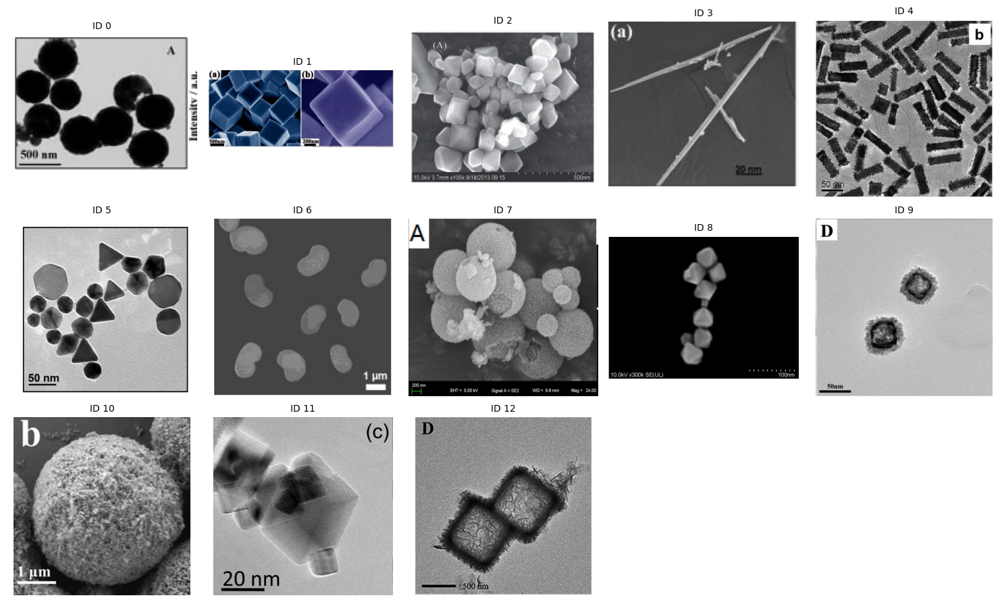

In [9]:
n = len(imgs)
cols = 5
rows = math.ceil(n / cols)

plt.figure(figsize=(3*cols, 3*rows))
for i, img in enumerate(imgs):
    ax = plt.subplot(rows, cols, i+1)
    ax.imshow(img)
    ax.set_title(f"ID {i}", fontsize=10)
    ax.axis("off")

plt.tight_layout()
plt.show()

In [41]:
masks_pred, flows, styles = model.eval(imgs, niter=1000) 

2026-01-15 11:10:54,310 [INFO] 0%|          | 0/13 [00:00<?, ?it/s]
2026-01-15 11:10:54,311 [INFO] processing image with (125, 160) HW, and 3 channels
2026-01-15 11:10:54,468 [INFO] processing image with (189, 467) HW, and 3 channels
2026-01-15 11:10:54,784 [INFO] processing image with (217, 259) HW, and 3 channels
2026-01-15 11:10:54,998 [INFO] processing image with (147, 161) HW, and 3 channels
2026-01-15 11:10:55,212 [INFO] processing image with (818, 822) HW, and 3 channels
2026-01-15 11:10:56,043 [INFO] processing image with (640, 650) HW, and 3 channels
2026-01-15 11:10:56,657 [INFO] processing image with (438, 440) HW, and 3 channels
2026-01-15 11:10:57,048 [INFO] processing image with (886, 942) HW, and 3 channels
2026-01-15 11:10:58,427 [INFO] processing image with (624, 838) HW, and 3 channels
2026-01-15 11:10:59,011 [INFO] processing image with (1120, 1112) HW, and 3 channels
2026-01-15 11:11:00,372 [INFO] processing image with (524, 520) HW, and 3 channels
2026-01-15 11:11:

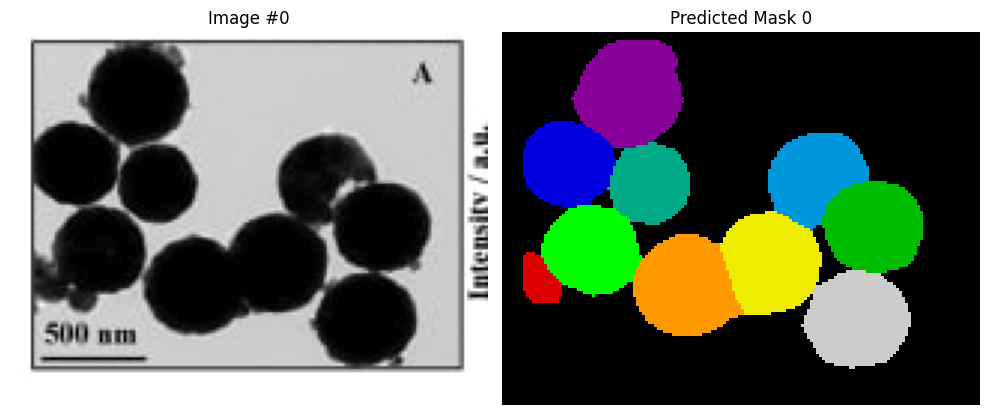

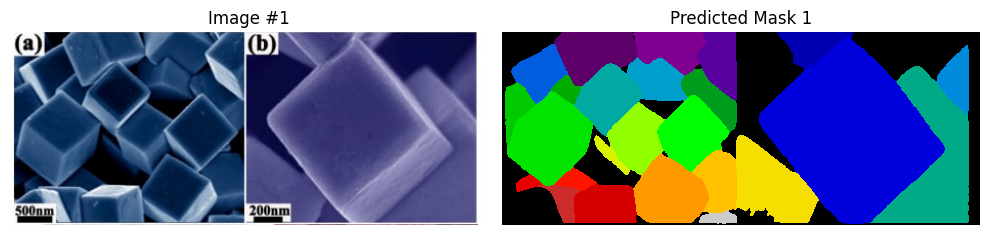

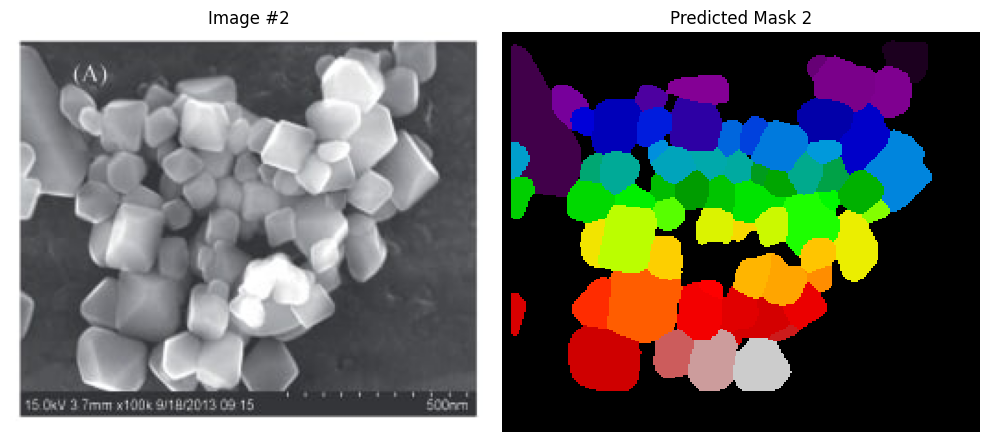

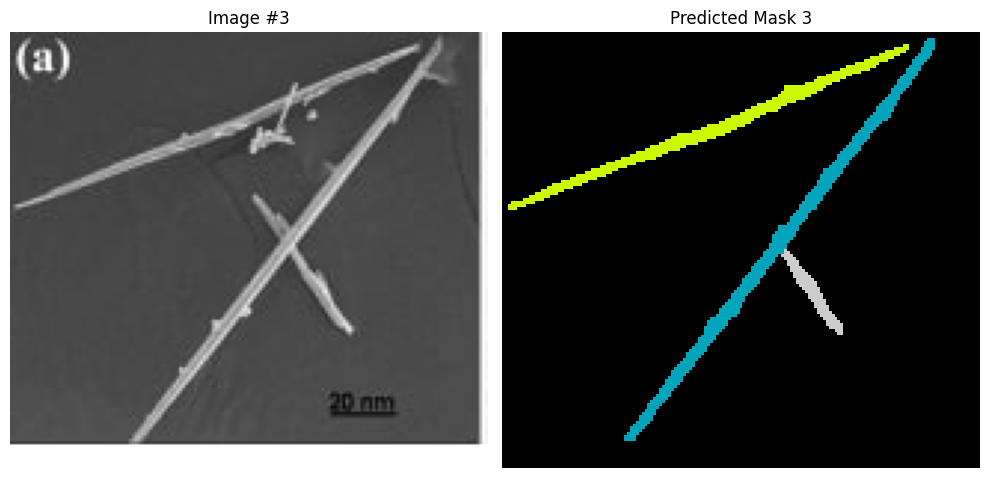

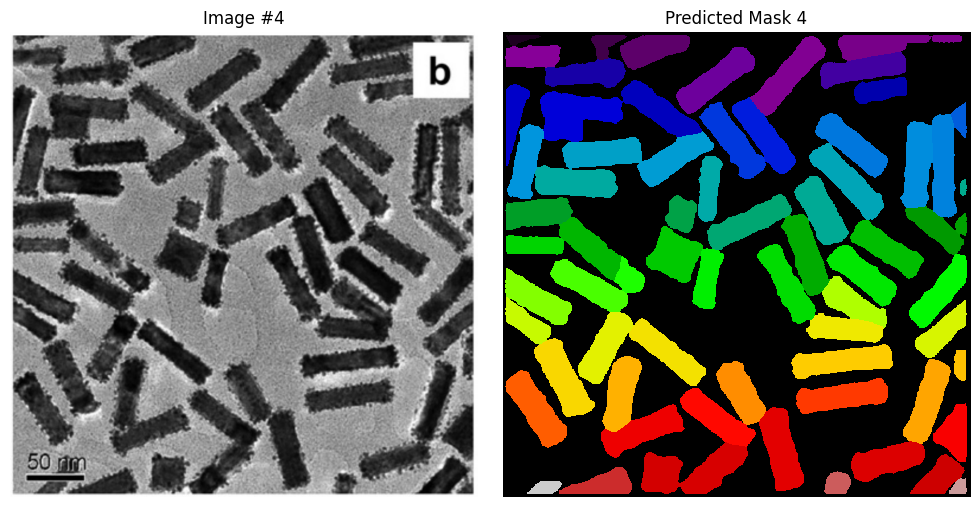

...

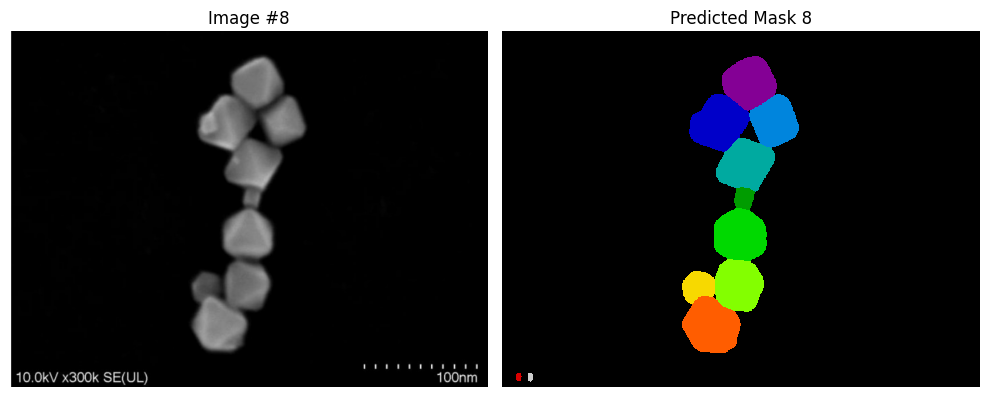

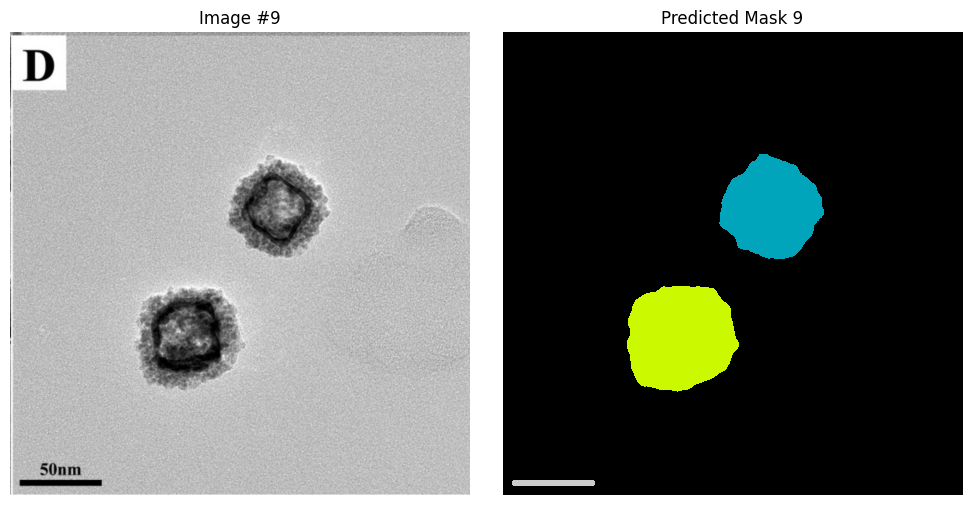

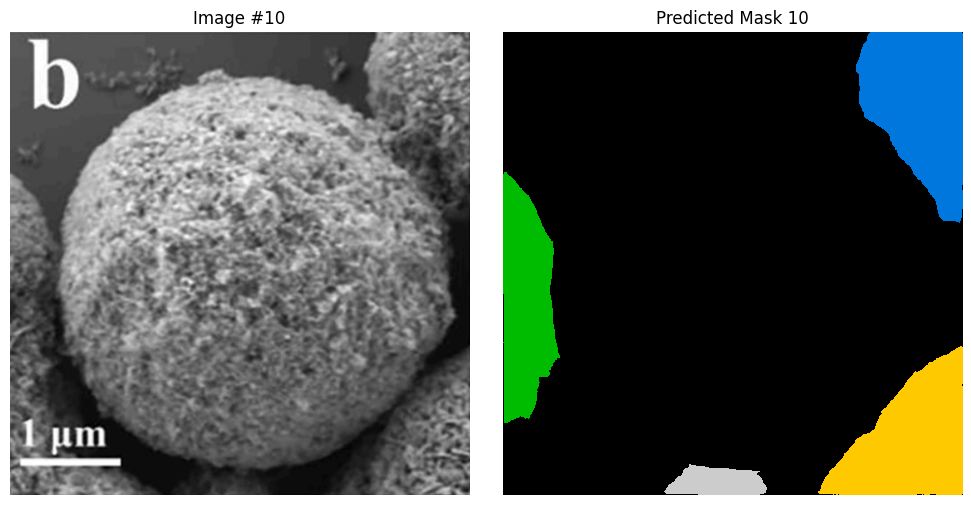

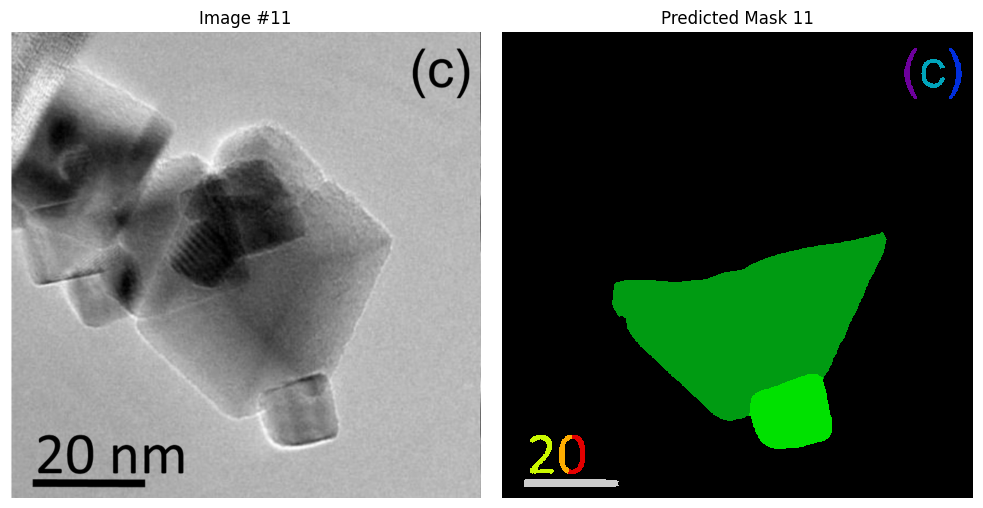

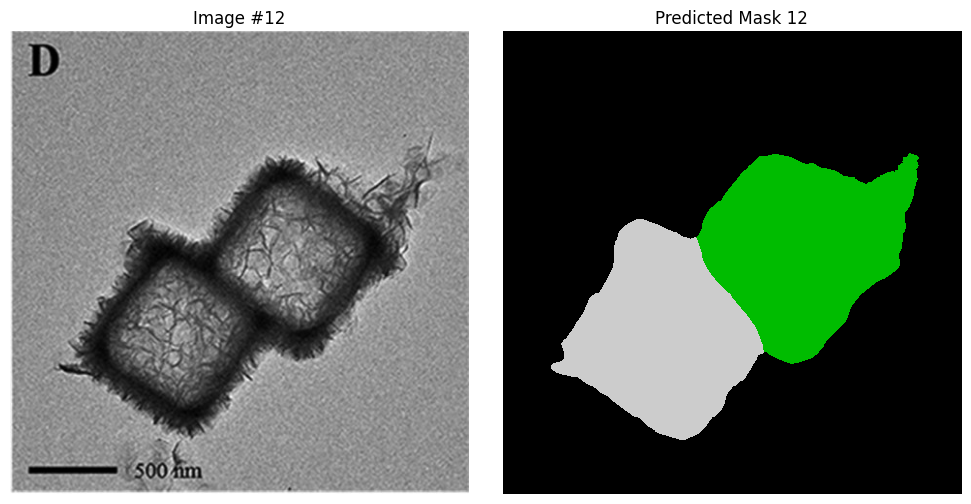

In [11]:
for i in range(len(imgs)):

    fig, ax = plt.subplots(1, 2, figsize=(10, 5))

    show_img = imgs[i].squeeze()
    ax[0].imshow(show_img)
    ax[0].set_title(f"Image #{i}")
    ax[0].axis('off')

    ax[1].imshow(masks_pred[i], cmap='nipy_spectral', interpolation='nearest')
    ax[1].set_title(f"Predicted Mask {i}")
    ax[1].axis('off')

    plt.tight_layout()
    plt.show()

In [12]:
def cutouts_from_label_mask(
    im: np.ndarray,            # HxWx3 uint8, RGB
    label_mask: np.ndarray,    # HxW uint16/uint32, 0=фон, 1..K = id объектов
    crop_to_mask: bool = True,
    min_pixels: int = 100,
):
    im_rgb = Image.fromarray(im).convert("RGBA")

    ids = np.unique(label_mask)
    ids = ids[ids != 0] 

    results = []
    for obj_id in ids:
        bin_mask = (label_mask == obj_id).astype(np.uint8) * 255
        if np.count_nonzero(bin_mask) < min_pixels:
            continue

        alpha = Image.fromarray(bin_mask).convert("L")  # 0..255

        cutout = im_rgb.copy()
        cutout.putalpha(alpha)  # альфа = маска 

        bbox = None
        if crop_to_mask:
            bbox = alpha.getbbox()  
            if bbox is None:
                continue
            cutout = cutout.crop(bbox)

        results.append((int(obj_id), cutout, bbox))

    return results

In [56]:
label_mask = masks_pred[8]
img = imgs[8]
cutouts = cutouts_from_label_mask(img, label_mask, crop_to_mask=True, min_pixels=100)

print("N objects:", len(cutouts))
# obj_id, cutout_rgba_pil, bbox = cutouts[4]
# cutout_rgba_pil.save(f"obj_{obj_id}.png") 

N objects: 11


In [57]:
cutouts

[(1, <PIL.Image.Image image mode=RGBA size=96x98>, (386, 43, 482, 141)),
 (2, <PIL.Image.Image image mode=RGBA size=106x103>, (328, 110, 434, 213)),
 (3, <PIL.Image.Image image mode=RGBA size=88x94>, (433, 111, 521, 205)),
 (4, <PIL.Image.Image image mode=RGBA size=104x96>, (375, 187, 479, 283)),
 (5, <PIL.Image.Image image mode=RGBA size=37x39>, (407, 274, 444, 313)),
 (6, <PIL.Image.Image image mode=RGBA size=93x93>, (371, 310, 464, 403)),
 (7, <PIL.Image.Image image mode=RGBA size=87x92>, (373, 400, 460, 492)),
 (8, <PIL.Image.Image image mode=RGBA size=58x59>, (316, 420, 374, 479)),
 (9, <PIL.Image.Image image mode=RGBA size=104x100>, (315, 465, 419, 565)),
 (10, <PIL.Image.Image image mode=RGBA size=11x15>, (24, 599, 35, 614)),
 (11, <PIL.Image.Image image mode=RGBA size=10x16>, (45, 599, 55, 615))]

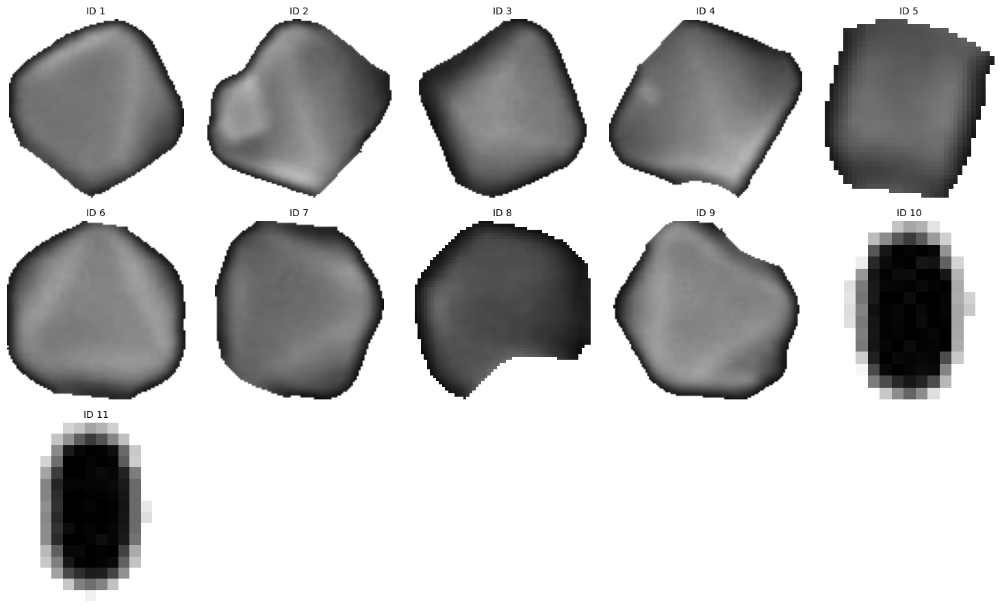

In [58]:
n = len(cutouts)
cols = 5
rows = math.ceil(n / cols)

plt.figure(figsize=(3*cols, 3*rows))
for i, (obj_id, cutout_pil, bbox) in enumerate(cutouts):
    ax = plt.subplot(rows, cols, i+1)
    ax.imshow(cutout_pil)
    ax.set_title(f"ID {obj_id}", fontsize=10)
    ax.axis("off")

plt.tight_layout()
plt.show()

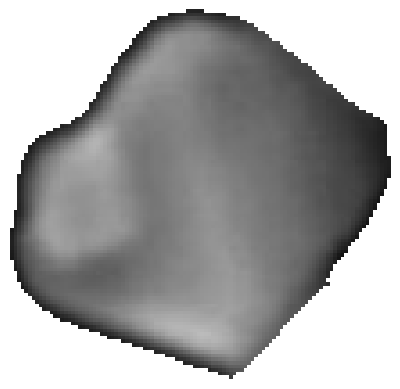

In [66]:
plt.imshow(cutouts[1][1])
plt.axis("off")
plt.show()

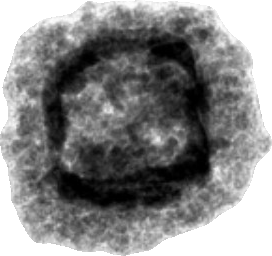

In [67]:
image

In [15]:
model_path = "tencent/Hunyuan3D-2"
subfolder = 'hunyuan3d-dit-v2-0-turbo'
pipeline_shapegen = Hunyuan3DDiTFlowMatchingPipeline.from_pretrained(model_path, subfolder=subfolder, use_safetensors=True)

pipeline_shapegen.enable_flashvdm()

image_path = "/mnt/tank/scratch/plutskyi/nanoshape/obj_2.png"
image = Image.open(image_path)

def run():
    return pipeline_shapegen(
        image=image,
        num_inference_steps=5,
        # octree_resolution=380,
        # num_chunks=200000,
        generator=torch.manual_seed(12345),
        output_type='trimesh'
    )[0]


save_dir = 'tmp/results/'
os.makedirs(save_dir, exist_ok=True)

for it in range(1):
    start_time = time.time()
    mesh = run()
    print("--- %s seconds ---" % (time.time() - start_time))
    mesh.export(f'{save_dir}/run_{it}.glb')

# mesh = pipeline_shapegen(image=image)[0]
# mesh.export("obj_2_turbo.glb")   

2026-01-08 08:25:27,356 - hy3dgen.shapgen - INFO - Try to load model from local path: /nfs/home/plutskyi/.cache/hy3dgen/tencent/Hunyuan3D-2/hunyuan3d-dit-v2-0-turbo


2026-01-08 08:25:27,356 [INFO] Try to load model from local path: /nfs/home/plutskyi/.cache/hy3dgen/tencent/Hunyuan3D-2/hunyuan3d-dit-v2-0-turbo


2026-01-08 08:25:27,358 - hy3dgen.shapgen - INFO - Model path not exists, try to download from huggingface


2026-01-08 08:25:27,358 [INFO] Model path not exists, try to download from huggingface


Fetching 3 files: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 7973.96it/s]
2026-01-08 08:25:27,620 - hy3dgen.shapgen - INFO - Loading model from /mnt/tank/scratch/plutskyi/hf_cache/models--tencent--Hunyuan3D-2/snapshots/9cd649ba6913f7a852e3286bad86bfa9a2d83dcf/hunyuan3d-dit-v2-0-turbo/model.fp16.safetensors


2026-01-08 08:25:27,620 [INFO] Loading model from /mnt/tank/scratch/plutskyi/hf_cache/models--tencent--Hunyuan3D-2/snapshots/9cd649ba6913f7a852e3286bad86bfa9a2d83dcf/hunyuan3d-dit-v2-0-turbo/model.fp16.safetensors
PointCrossAttentionEncoder INFO: pc_sharpedge_size is given, using pc_size=5120, pc_sharpedge_size=5120


2026-01-08 08:25:50,729 - hy3dgen.shapgen - INFO - Try to load model from local path: /nfs/home/plutskyi/.cache/hy3dgen/tencent/Hunyuan3D-2/hunyuan3d-vae-v2-0-turbo


2026-01-08 08:25:50,729 [INFO] Try to load model from local path: /nfs/home/plutskyi/.cache/hy3dgen/tencent/Hunyuan3D-2/hunyuan3d-vae-v2-0-turbo


2026-01-08 08:25:50,730 - hy3dgen.shapgen - INFO - Model path not exists, try to download from huggingface


2026-01-08 08:25:50,730 [INFO] Model path not exists, try to download from huggingface


Fetching 3 files: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 36900.04it/s]
2026-01-08 08:25:50,880 - hy3dgen.shapgen - INFO - Loading model from /mnt/tank/scratch/plutskyi/hf_cache/models--tencent--Hunyuan3D-2/snapshots/9cd649ba6913f7a852e3286bad86bfa9a2d83dcf/hunyuan3d-vae-v2-0-turbo/model.fp16.safetensors


2026-01-08 08:25:50,880 [INFO] Loading model from /mnt/tank/scratch/plutskyi/hf_cache/models--tencent--Hunyuan3D-2/snapshots/9cd649ba6913f7a852e3286bad86bfa9a2d83dcf/hunyuan3d-vae-v2-0-turbo/model.fp16.safetensors
PointCrossAttentionEncoder INFO: pc_sharpedge_size is given, using pc_size=5120, pc_sharpedge_size=5120


Diffusion Sampling:: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00,  7.81it/s]
2026-01-08 08:25:53,310 - hy3dgen.shapgen - INFO - FlashVDMVolumeDecoding Resolution: [95, 190, 380]


2026-01-08 08:25:53,310 [INFO] FlashVDMVolumeDecoding Resolution: [95, 190, 380]


FlashVDM Volume Decoding: 100%|██████████████████████████████████████████████████████████████████████████████████████████████| 64/64 [00:00<00:00, 1025.74it/s]
/mnt/tank/scratch/plutskyi/nanoshape/Hunyuan3D-2/hy3dgen/shapegen/models/autoencoders/volume_decoders.py:81: UserWarning: Using a non-tuple sequence for multidimensional indexing is deprecated and will be changed in pytorch 2.9; use x[tuple(seq)] instead of x[seq]. In pytorch 2.9 this will be interpreted as tensor index, x[torch.tensor(seq)], which will result either in an error or a different result (Triggered internally at /pytorch/torch/csrc/autograd/python_variable_indexing.cpp:345.)
  sliced = padded[slice_dims]


--- 2.8666746616363525 seconds ---


In [16]:
import numpy as np
from PIL import Image

def file_reader_jpg(path):
    im = Image.open(path).convert("L")
    data = np.array(im, dtype=np.uint16)  
    
    return [{'data': data}]

2026-01-13 12:15:19.451731: W tensorflow/core/common_runtime/gpu/gpu_device.cc:2256] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you would like to use GPU. Follow the guide at https://www.tensorflow.org/install/gpu for how to download and setup the required libraries for your platform.
Skipping registering GPU devices...


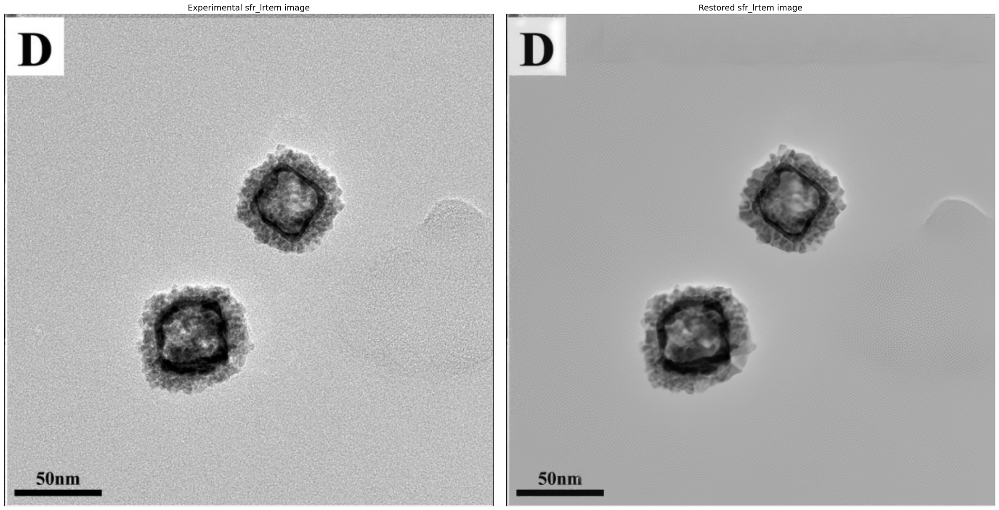

In [19]:
from tk_r_em import load_network
import matplotlib.pyplot as plt
import os

"""
Perform inference on test data using a pre-trained model and visualize the results.
"""
# select one of the available networks from [sfr_hrsem, sfr_lrsem, sfr_hrstem, sfr_lrstem, sfr_hrtem, sfr_lrtem]
net_name = 'sfr_lrtem'

# Use the current working directory as the root directory
root = os.getcwd()

# Example of constructing a path relative to the current working directory
path = '/mnt/tank/scratch/plutskyi/nanoshape/test_images/923.jpg'
    
x = file_reader_jpg(path)
x = np.array(x[0]['data'], np.float32)

# load its corresponding model
r_em_nn = load_network(net_name)
# r_em_nn.summary()

# run inference
y_p = r_em_nn.predict_patch_based(x, batch_size=4)

fig, axs = plt.subplots(1, 2, figsize=(24, 12))
ir = 0
axs[ir].imshow(x, cmap='gray')
axs[ir].set_xticks([])
axs[ir].set_yticks([])
axs[ir].grid(False)
axs[ir].set_title(f"Experimental {net_name} image", fontsize=14, )

ir = 1
axs[ir].imshow(y_p, cmap='gray')
axs[ir].set_xticks([])
axs[ir].set_yticks([])
axs[ir].grid(False)
axs[ir].set_title(f"Restored {net_name} image", fontsize=14)

plt.subplots_adjust(hspace=2, wspace=10)
plt.tight_layout()
plt.savefig(f"restored_Zebra.png", format='png',dpi=600)
plt.show()

In [18]:
from tk_r_em import load_network
import matplotlib.pyplot as plt
import os


# select one of the available networks from [sfr_hrsem, sfr_lrsem, sfr_hrstem, sfr_lrstem, sfr_hrtem, sfr_lrtem]
net_name = 'sfr_lrtem'

# Use the current working directory as the root directory
root = os.getcwd()

# load its corresponding model
r_em_nn = load_network(net_name)

2026-01-15 10:58:54.877753: W tensorflow/core/common_runtime/gpu/gpu_device.cc:2256] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you would like to use GPU. Follow the guide at https://www.tensorflow.org/install/gpu for how to download and setup the required libraries for your platform.
Skipping registering GPU devices...



[1/13] 114.jpg


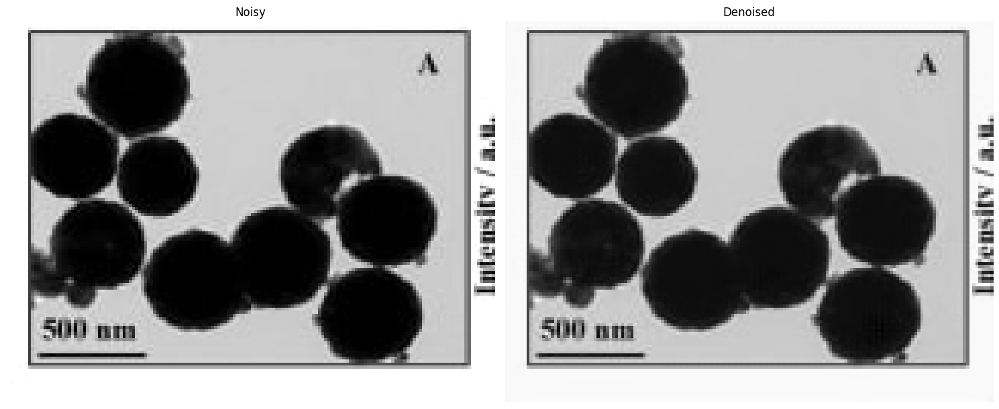


[2/13] 201.jpg


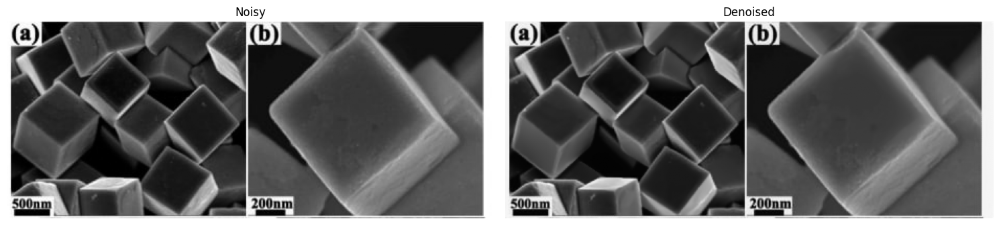


[3/13] 269.jpg


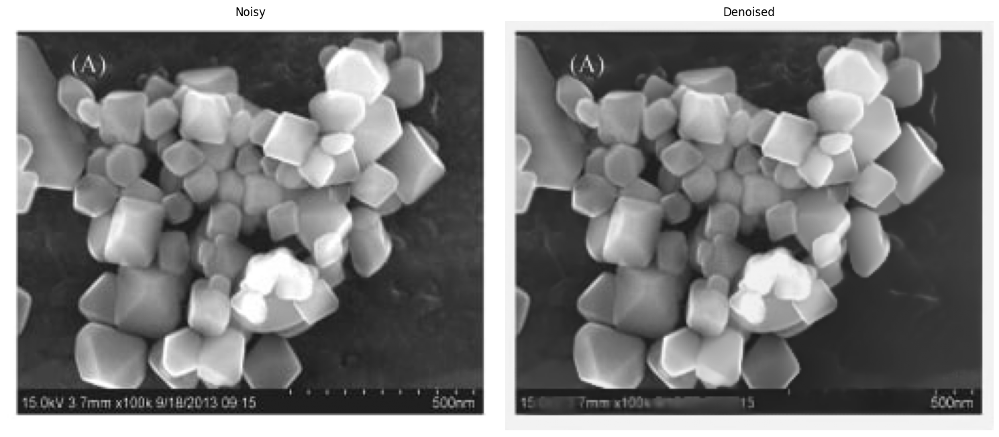


[4/13] 464.jpg


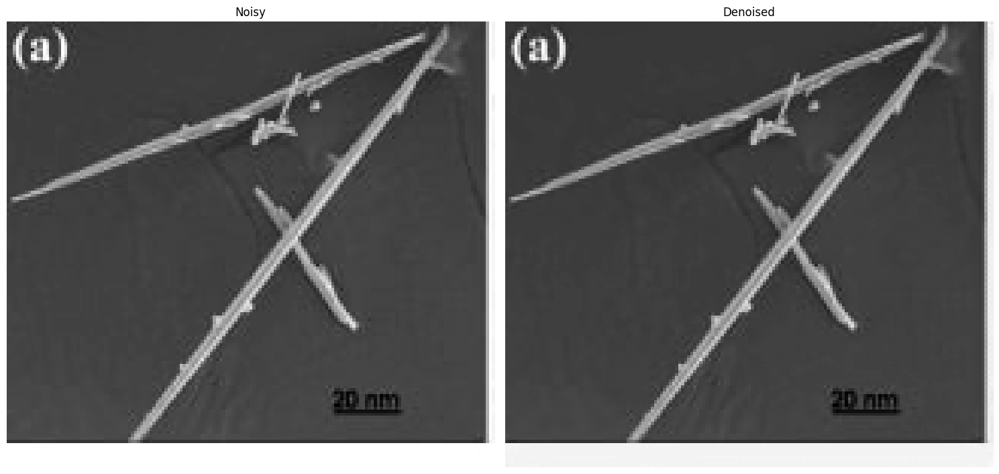


[5/13] 611.jpg


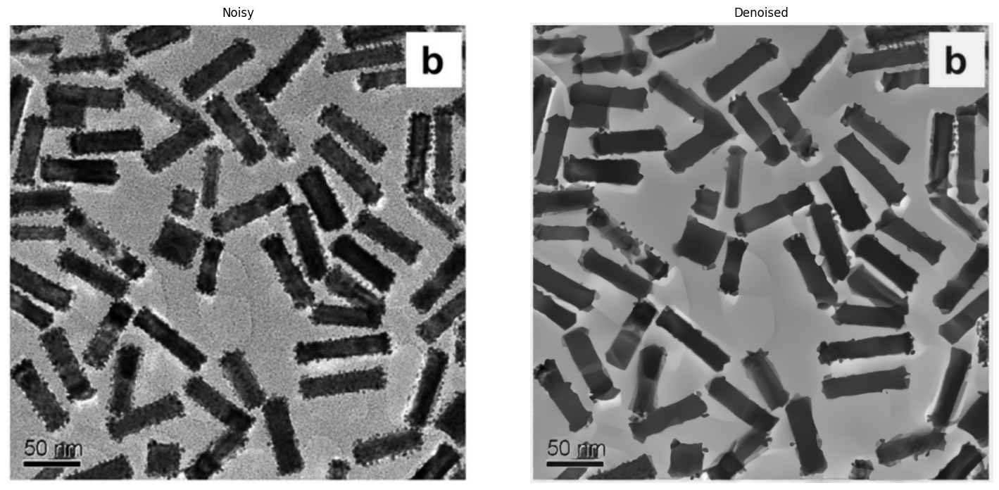


[6/13] 725.jpg


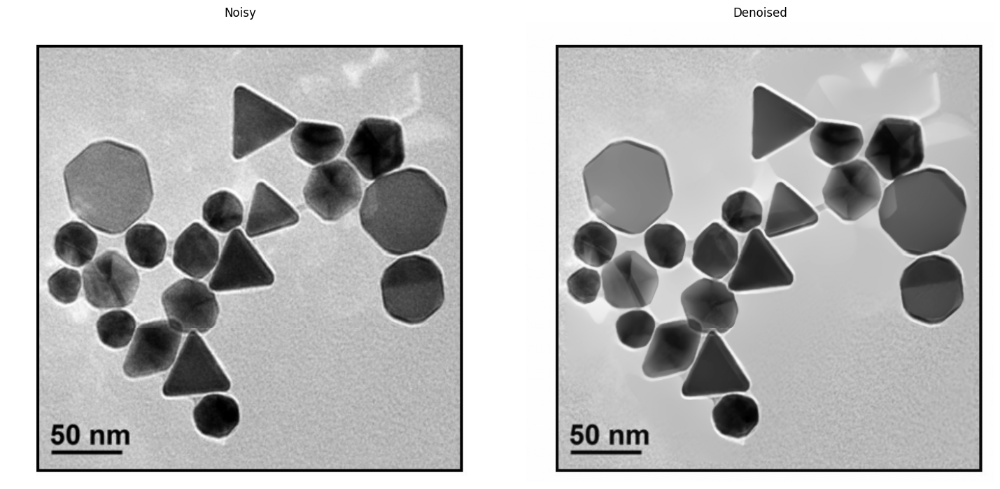


[7/13] 748.jpg


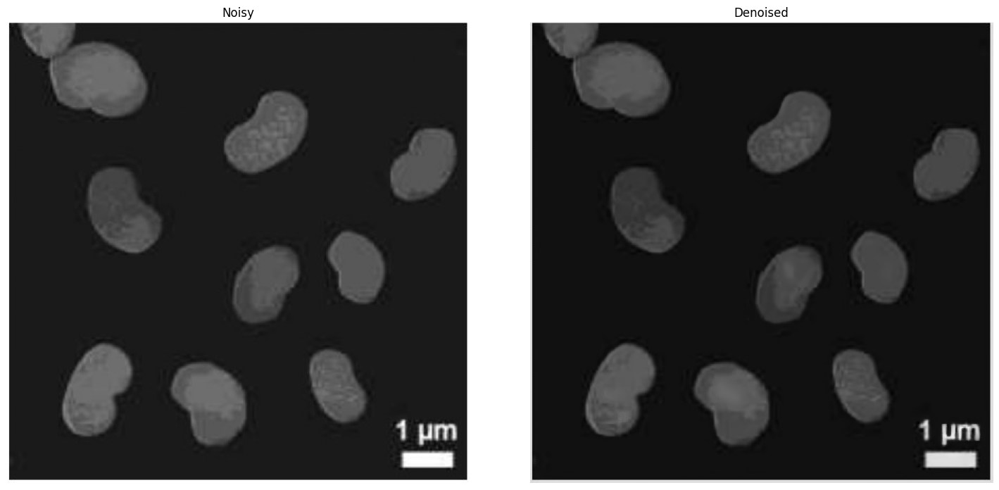


[8/13] 772.jpg


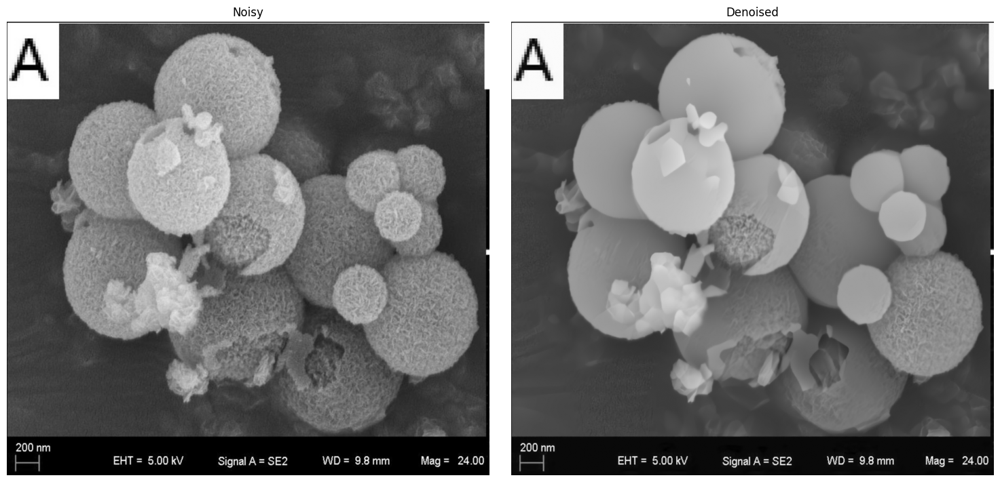


[9/13] 890.jpg


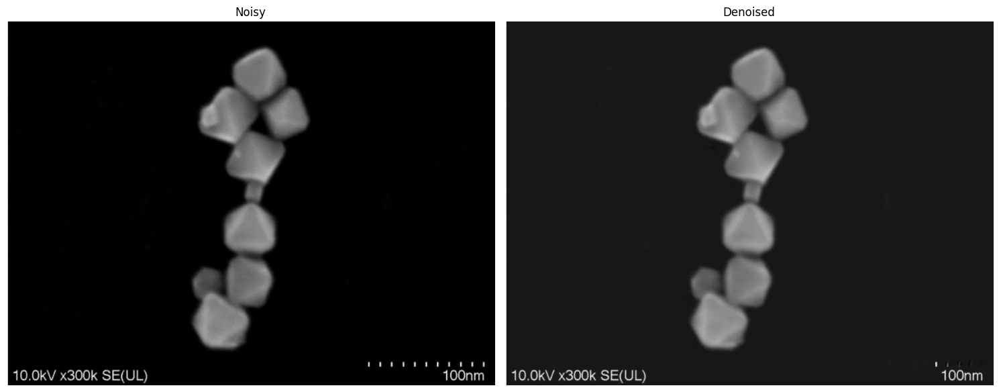


[10/13] 923.jpg


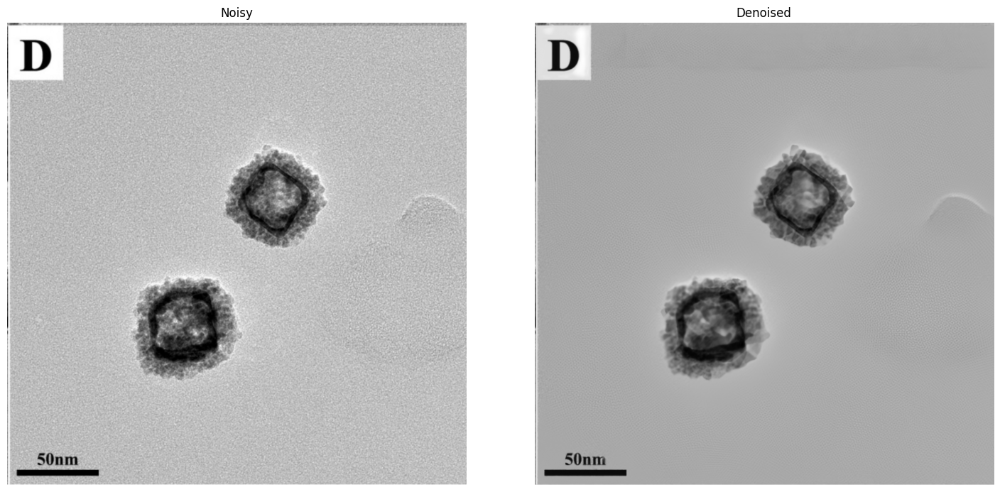


[11/13] 943.jpg


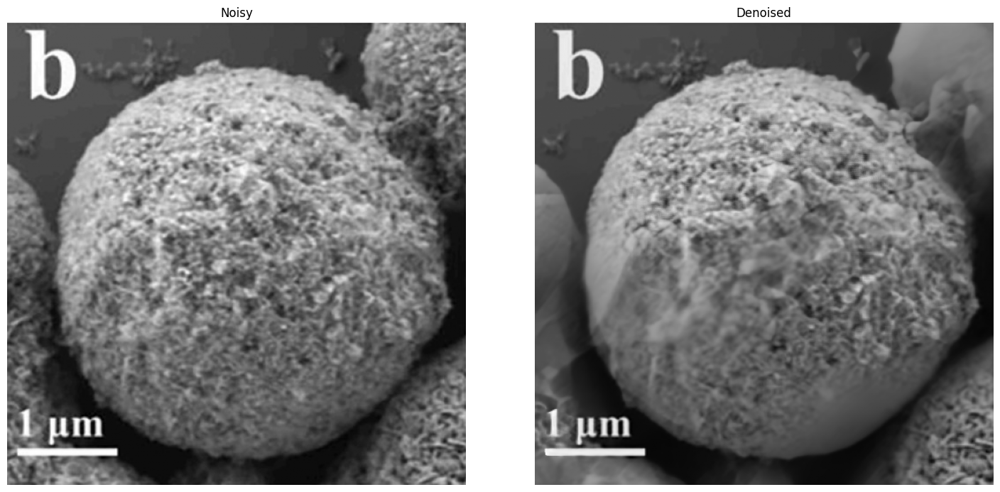


[12/13] 966.jpg


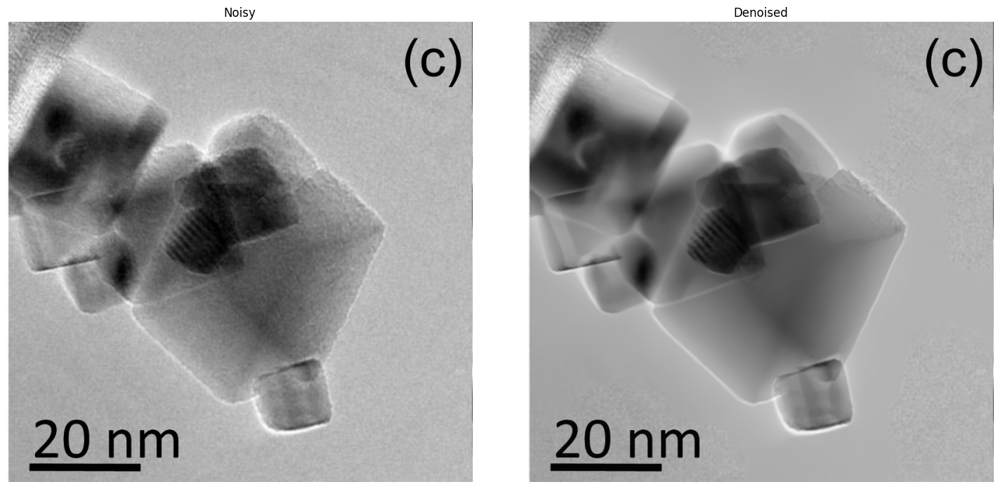


[13/13] 987TEM.jpg


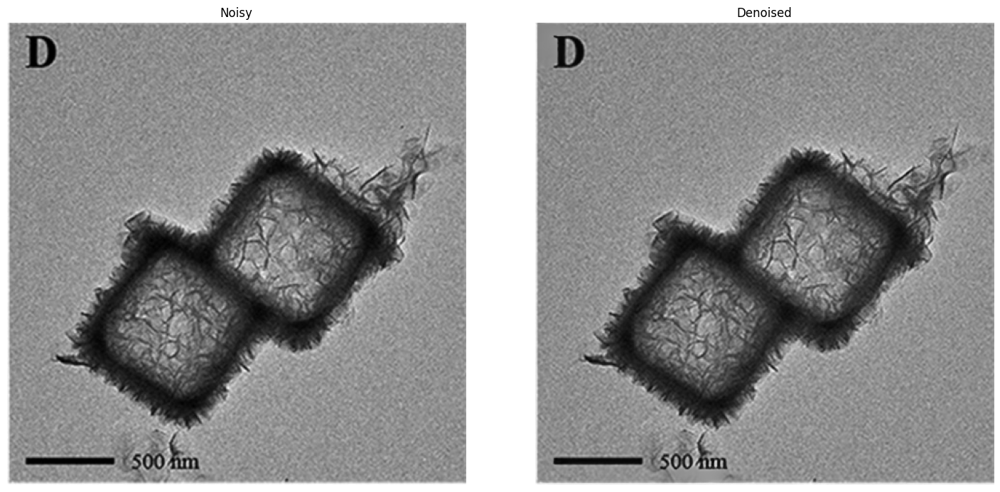

Все изображения обработаны!


In [44]:
denoise_imgs = []

for i, path in enumerate(files):
    print(f"\n[{i+1}/{len(files)}] {os.path.basename(path)}")
    
    data = file_reader_jpg(path)
    x = np.array(data[0]['data'])
    
    y_p = r_em_nn.predict_patch_based(x)

    denoise_imgs.append(y_p)
    
    fig, axs = plt.subplots(1, 2, figsize=(15, 7))
    axs[0].imshow(x, cmap='gray'); axs[0].set_title('Noisy'); axs[0].axis('off')
    axs[1].imshow(y_p, cmap='gray'); axs[1].set_title('Denoised'); axs[1].axis('off')
    
    plt.tight_layout()
    # plt.savefig(f"denoised_{i:02d}_{os.path.basename(path)}", dpi=300, bbox_inches='tight')
    plt.show()  
    

print("Все изображения обработаны!")

In [46]:
masks_pred_denoise, flows_denoise, styles_denoise = model.eval(denoise_imgs, niter=1000) 

2026-01-15 11:16:41,054 [INFO] 0%|          | 0/13 [00:00<?, ?it/s]
2026-01-15 11:16:41,056 [INFO] processing grayscale image with (125, 160) HW
2026-01-15 11:16:41,254 [INFO] processing grayscale image with (189, 467) HW
2026-01-15 11:16:41,569 [INFO] processing grayscale image with (217, 259) HW
2026-01-15 11:16:41,781 [INFO] processing grayscale image with (147, 161) HW
2026-01-15 11:16:41,988 [INFO] processing grayscale image with (818, 822) HW
2026-01-15 11:16:42,796 [INFO] processing grayscale image with (640, 650) HW
2026-01-15 11:16:43,388 [INFO] processing grayscale image with (438, 440) HW
2026-01-15 11:16:43,772 [INFO] processing grayscale image with (886, 942) HW
2026-01-15 11:16:45,017 [INFO] processing grayscale image with (624, 838) HW
2026-01-15 11:16:45,589 [INFO] processing grayscale image with (1120, 1112) HW
2026-01-15 11:16:46,906 [INFO] processing grayscale image with (524, 520) HW
2026-01-15 11:16:47,354 [INFO] processing grayscale image with (788, 796) HW
2026-0

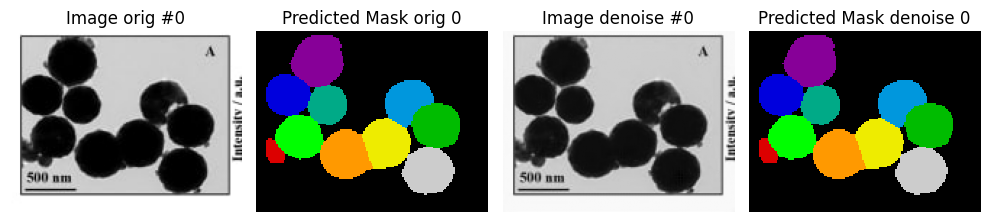

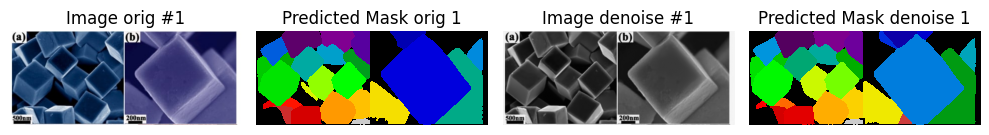

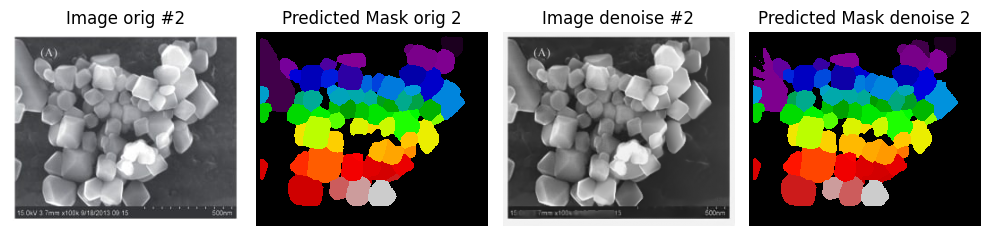

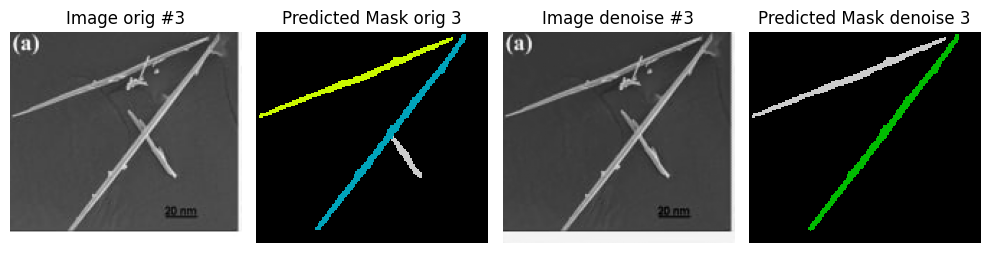

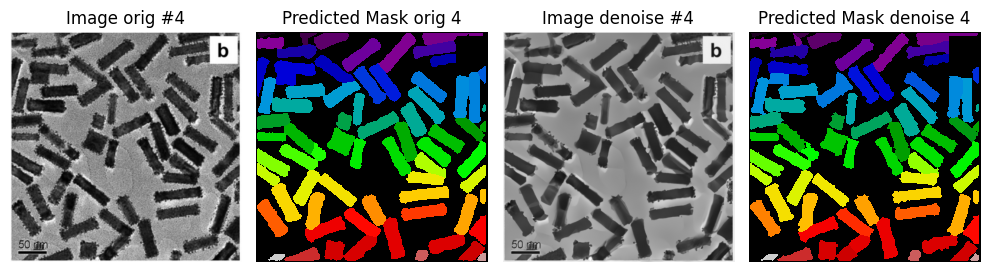

...

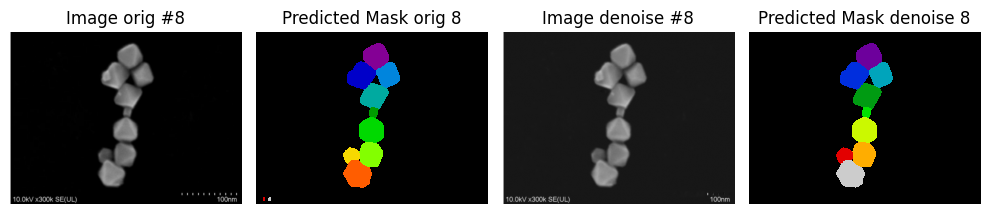

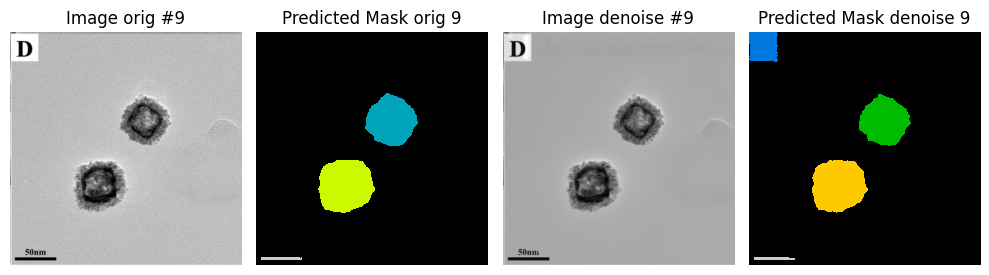

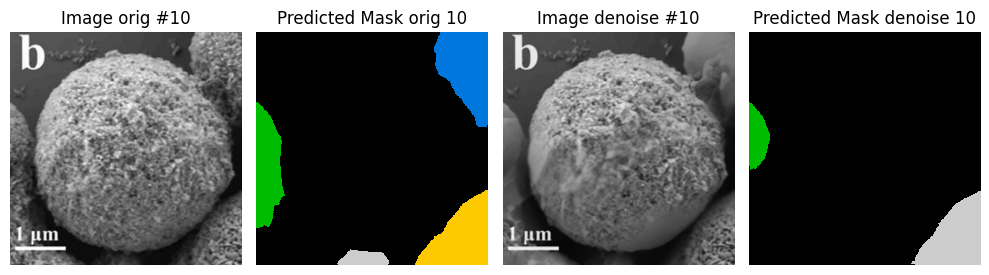

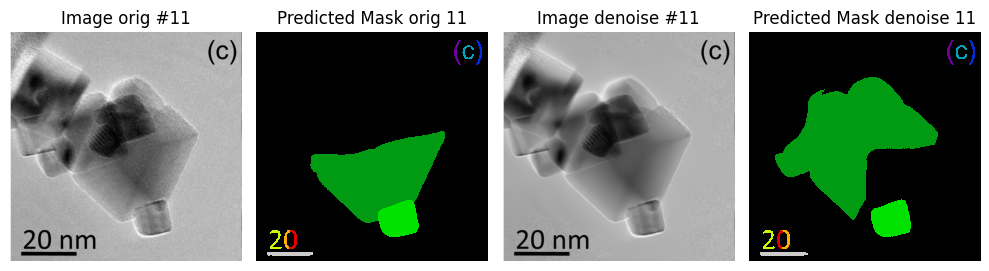

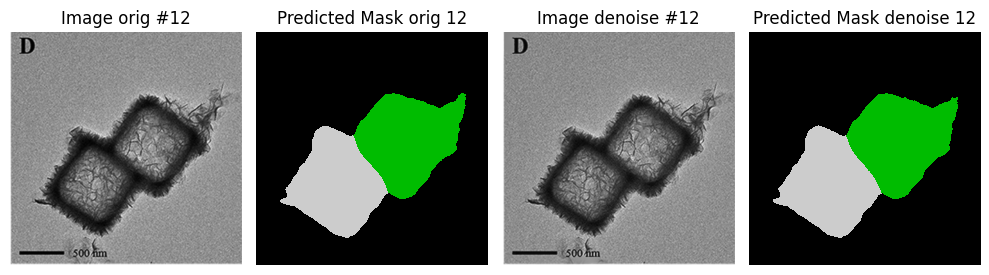

In [49]:
for i in range(13):
    fig, ax = plt.subplots(1, 4, figsize=(10, 5))
    show_img_orig = imgs[i].squeeze()
    show_img_denoise = denoise_imgs[i].squeeze()

    ax[0].imshow(show_img_orig, cmap='gray')
    ax[0].set_title(f"Image orig #{i}")
    ax[0].axis('off')

    ax[1].imshow(masks_pred[i], cmap='nipy_spectral', interpolation='nearest')
    ax[1].set_title(f"Predicted Mask orig {i}")
    ax[1].axis('off')

    ax[2].imshow(show_img_denoise, cmap='gray')
    ax[2].set_title(f"Image denoise #{i}")
    ax[2].axis('off')

    ax[3].imshow(masks_pred_denoise[i], cmap='nipy_spectral', interpolation='nearest')
    ax[3].set_title(f"Predicted Mask denoise {i}")
    ax[3].axis('off')

    plt.tight_layout()
    plt.show()

Всё абсолютно логично, так как учил я модель на данных с шумом.......

Я думал что Upscale и denoising оригинального изображения это лучший вариант, но теперь мне кажется, что лучше будет улучшать качество частиц  так как (Upscale не надежен, надо искать метрики.... нашел QWEN но он тяжелый и скорее всего тот ещё выдумщик) что можео придумать на маленьком изображении? + как-будто если что-то и дорисует эксперт увидит и задаст допустим более корректный промпт если мы используем LLM.


Вопросы: 
1) Физ ограничения
2) OCR для размеров
3) Уже не вопрос, но Single Particle analysis
4) Синтетика разные углы
5) Как-будто GenPoly со своей полиморфной эволюцей не сможет хорошо воспроизвести 3д, да он постепенно восстанавливает формы, но как восстановить форму из 1 проекции 


6) Кластеризация.... Нужна ли или лучше дать пользователю самому выбрать частицу или может вариант ещё лучше.. Сделать кластеры и дать возможность выбрать что пойдёт на реконструкцию после кластеризации и нахождениея центройдов пользователю


